[![](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/maweigert/neubias_academy_stardist/blob/master/notebooks/stardist_example_2D_colab.ipynb)

# Demo: Stardist custom training workflow (2D)


To run the workflow on your own workstation/data, consider using our jupyter notebooks:  
https://github.com/mpicbg-csbd/stardist/tree/master/examples

# 0. Installation and preparation

1. Set the google runtime to GPU ("Runtime->Change runtime type" select GPU)
2. Install tensorflow (< version 2 for now)
3. Install stardist


In [1]:
!pip install stardist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 6.2 MB/s eta 0:00:00


In [2]:
import numpy as np
import sys
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file, normalize

from stardist.matching import matching_dataset
from stardist import fill_label_holes, random_label_cmap, relabel_image_stardist, calculate_extents, gputools_available, _draw_polygons
from stardist.models import Config2D, StarDist2D, StarDistData2D

np.random.seed(42)
lbl_cmap = random_label_cmap()

# 1. Data

This section demonstrates how the training data for *StarDist* should look like and whether the annotated objects can be appropriately described by star-convex polygons.

The training data that needs to be provided for StarDist consists of corresponding pairs of raw images and pixelwise annotated ground truth images (masks), where every pixel has a unique integer value indicating the object id (or 0 for background).


If you want to use your own data, you would need to

1. Create a folder (e.g. "mydata") that includes the images and label masks for the training and test cases. The folder should have the following structure:

```
data
 |-mydata
 | |-train
 | | |-images
 | | | | image1.tif
 | | | | image2.tif
 | | | | ...
 | | |-masks
 | | | | mask1.tif
 | | | | mask2.tif
 | | | | ...
 | |-test
 | | |-images
 | | | | ...
 | | |-masks
 | | | | ...
 ```

2. Upload this data to your google drive

3. Mount your google drive

```
from google.colab import drive
drive.mount('/content/drive')
!ls /content/drive/My\ Drive/
```

4. Change the appropriate folder names below to the ones on your google drive.


For this demo we will download the file `dsb2018.zip` that contains the respective train and test images with associated ground truth labels as used in [our paper](https://arxiv.org/abs/1806.03535).
They are a subset of the `stage1_train` images from the Kaggle 2018 Data Science Bowl, which are [available in full](https://data.broadinstitute.org/bbbc/BBBC038/) from the [Broad Bioimage Benchmark Collection](https://data.broadinstitute.org/bbbc/).



In [23]:
from google.colab import drive
drive.mount('/content/drive')
!ls /content/drive/My\ Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 049_451972Juliano_PhysicochemicalpropertiesofstarchandproteininrelationtoGrainQualityandNutritionalValueofrice.pdf
'47_243 (1).pdf'
 47_243.pdf
'Colab Notebooks'
 data
 data.zip
 dsb2018.zip
 image.png
 LINE_MOVIE_1570711497016.mp4
 Physicochemicalpropertiesandstructureofst.pdf
 POE16.pdf
 ProjectGUI1.rar
'research Medthology'
 YingkamolAnAll.pdf
 YouCut_20190508_212953447.mp4
 ชุดแบบฝึกหัดอนุบาล.rar
 นับเมล็ดข้าว.pdf
 แผนที่ที่ไม่มีชื่อ.gmap
'พื้นที่โครงการผัก 01.gmap'
 พื้นที่เตรียมปลูกหญ้าเนเปีย.gmap
'สำเนาของ พื้นที่โครงการผัก 01.gmap'
 หลักฐานการโอนค่าลงทะเบียนCP2299_NC.jpg


In [31]:
download_and_extract_zip_file(
    url       = 'https://drive.google.com/uc?export=download&id=1whWPMGWDUCSBQQLssCqCza5mq5-UFeWa',
    targetdir = 'StarRice',
    verbose   = 1,
)

Files missing, downloading... extracting... done.


In [36]:
!find data -type d | sed -e "s/[^-][^\/]*\// |/g" -e "s/|\([^ ]\)/|-\1/"

data
 |-StarRice
 | |-data
 | | |-train
 | | | |-images
 | | | |-masks
 | | |-test
 | | | |-images
 | | | |-masks
 | |-train
 | | |-images
 | | |-masks
 | |-test
 | | |-images
 | | |-masks


In [38]:
fX = sorted(Path('data/StarRice/train/images/').glob('*.tif'))
fY = sorted(Path('data/StarRice/train/masks').glob('*.tif'))
print(f"found {len(fX)} training images and {len(fY)} training masks")
assert all(Path(x).name==Path(y).name for x,y in zip(fX,fY))

found 15 training images and 15 training masks


Load only a small subset for display

In [39]:
fX_small, fY_small = fX[:10], fY[:10]

In [40]:
X_small = list(map(imread,map(str,fX_small)))
Y_small = list(map(imread,map(str,fY_small)))

## Example image

In [41]:
i = min(4, len(X_small)-1)
img, lbl = X_small[i], fill_label_holes(Y_small[i])
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
# assumed axes ordering of img and lbl is: YX(C)

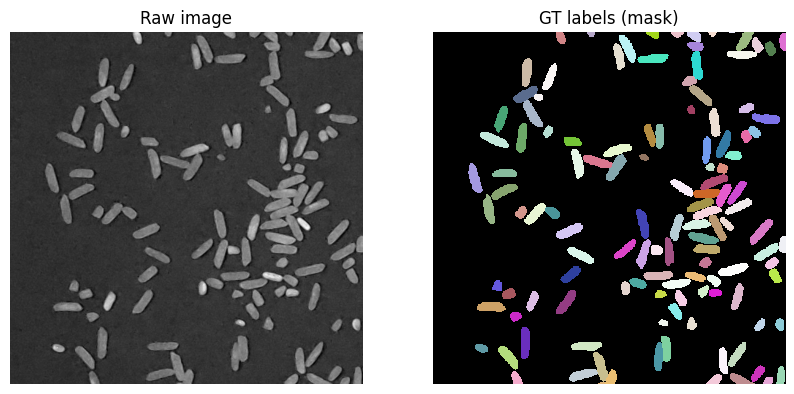

In [42]:
plt.figure(figsize=(10,8))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels (mask)')
None;

## Fitting ground-truth labels with star-convex polygons

In [43]:
n_rays = [2**i for i in range(2,8)]
print(n_rays)

[4, 8, 16, 32, 64, 128]


### Example image reconstructed with various number of rays

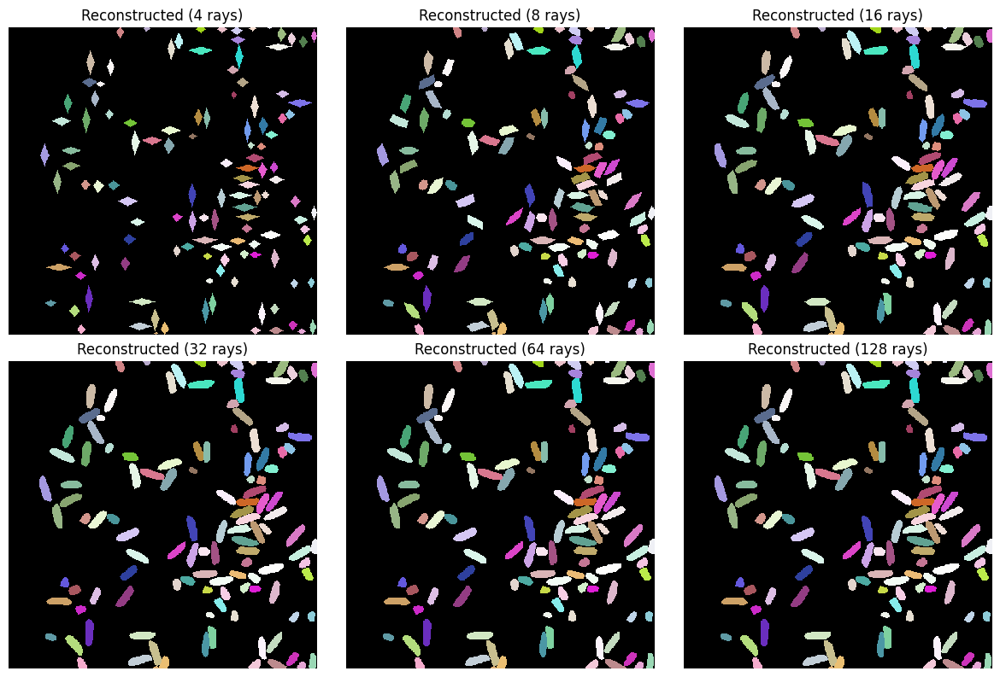

In [44]:
fig, ax = plt.subplots(2,3, figsize=(12,8))
for a,r in zip(ax.flat,n_rays):
    a.imshow(relabel_image_stardist(lbl, n_rays=r), cmap=lbl_cmap, interpolation="nearest")
    a.set_title('Reconstructed (%d rays)' % r)
    a.axis('off')
plt.tight_layout();

#### Mean IoU for different number of rays

In [45]:
scores = []
for r in tqdm(n_rays):
    Y_reconstructed = [relabel_image_stardist(lbl, n_rays=r) for lbl in Y_small]
    mean_iou = matching_dataset(Y_small, Y_reconstructed, thresh=0, show_progress=False).mean_true_score
    scores.append(mean_iou)

100%|██████████| 6/6 [00:30<00:00,  5.00s/it]


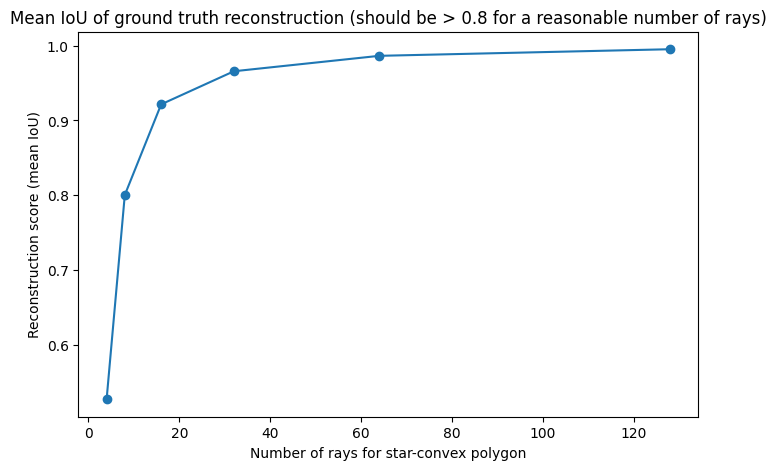

In [46]:
plt.figure(figsize=(8,5))
plt.plot(n_rays, scores, 'o-')
plt.xlabel('Number of rays for star-convex polygon')
plt.ylabel('Reconstruction score (mean IoU)')
plt.title("Mean IoU of ground truth reconstruction (should be > 0.8 for a reasonable number of rays)")
None;

# 2. Training


Training data (for input `X` with associated label masks `Y`) can be provided via lists of numpy arrays, where each image can have a different size. Alternatively, a single numpy array can also be used if all images have the same size.  
Input images can either be two-dimensional (single-channel) or three-dimensional (multi-channel) arrays, where the channel axis comes last. Label images need to be integer-valued.

In [47]:
fX = sorted(Path('data/StarRice/train/images/').glob('*.tif'))
fY = sorted(Path('data/StarRice/train/masks').glob('*.tif'))
assert all(Path(x).name==Path(y).name for x,y in zip(fX,fY))
print(f"{len(fX)} files found")

15 files found


In [48]:
X = list(map(imread,map(str,tqdm(fX))))
Y = list(map(imread,map(str,tqdm(fY))))
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

100%|██████████| 15/15 [00:00<00:00, 491.59it/s]


Normalize images and fill small label holes.

In [49]:
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X)]
Y = [fill_label_holes(y) for y in tqdm(Y)]

100%|██████████| 15/15 [00:00<00:00, 44.48it/s]


Split into train and validation datasets.

In [50]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train]
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images:  15
- training:        13
- validation:       2


Training data consists of pairs of input image and label instances.

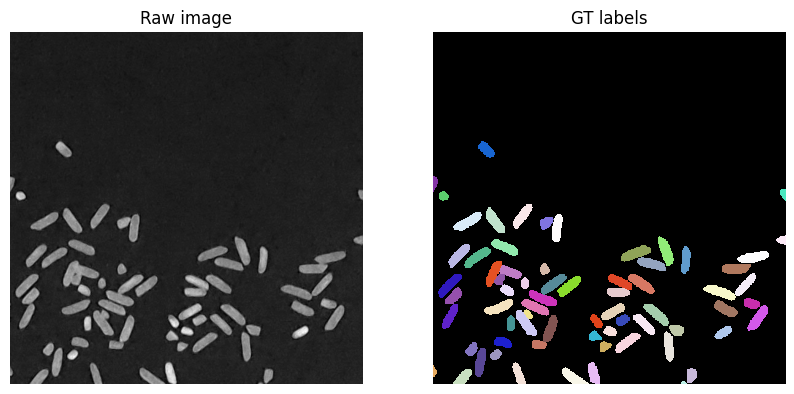

In [51]:
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
plt.figure(figsize=(10,8))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels')
None;

## Configuration

A `StarDist2D` model is specified via a `Config2D` object.

In [52]:
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [53]:
conf = Config2D (
    n_rays       = 32,
    grid         = (2,2),
    n_channel_in = 1,
)
print(conf)
vars(conf)

Config2D(n_dim=2, axes='YXC', n_channel_in=1, n_channel_out=33, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=32, grid=(2, 2), backbone='unet', n_classes=None, unet_n_depth=3, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(256, 256), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_loss_weights=(1, 0.2), train_class_weights=(1, 1), train_epochs=400, train_steps_per_epoch=100, train_learning_rate=0.0003, train_batch_size=4, train_n_val_patches=None, train_tensorboard=True, train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,


**Note:** The trained `StarDist2D` model will *not* predict completed shapes for partially visible objects at the image boundary if `train_shape_completion=False` (which is the default option).

In [54]:
model = StarDist2D(conf, name='stardist', basedir='models')

Using default values: prob_thresh=0.5, nms_thresh=0.4.


Check if the neural network has a large enough field of view to see up to the boundary of most objects.

In [55]:
median_size = calculate_extents(list(Y), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")
else:
    print("All good! (object sizes fit into field of view of the neural network)")


All good! (object sizes fit into field of view of the neural network)


## Pretrained Models

The following command can be used to show a list of available pretrained models:

In [56]:
StarDist2D.from_pretrained()

There are 4 registered models for 'StarDist2D':

Name                  Alias(es)
────                  ─────────
'2D_versatile_fluo'   'Versatile (fluorescent nuclei)'
'2D_versatile_he'     'Versatile (H&E nuclei)'
'2D_paper_dsb2018'    'DSB 2018 (from StarDist 2D paper)'
'2D_demo'             None


## Augmentation


You can define a function/callable that applies augmentation to each batch of the data generator.  
We here use an `augmenter` that applies random rotations, flips, and intensity changes, which are typically sensible for (2D) microscopy images:

In [57]:
def random_fliprot(img, mask):
    axes = tuple(range(img.ndim))
    perm = np.random.permutation(axes)
    img = img.transpose(perm)
    mask = mask.transpose(perm)
    for ax in axes:
        if np.random.rand()>.5:
            img = np.flip(img,axis = ax)
            mask = np.flip(mask,axis = ax)
    return img, mask

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-.2,.2)
    return img


def augmenter(img,mask):
    """Augmentation for image,mask"""
    img, mask = random_fliprot(img, mask)
    img = random_intensity_change(img)
    return img, mask

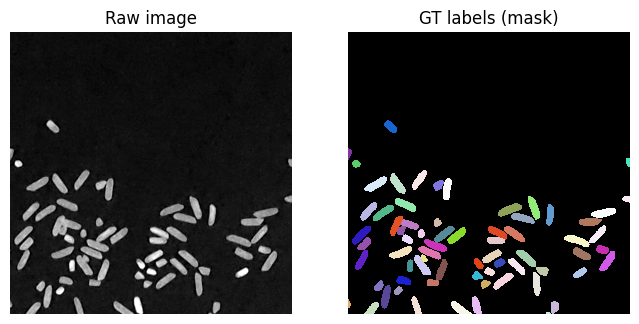

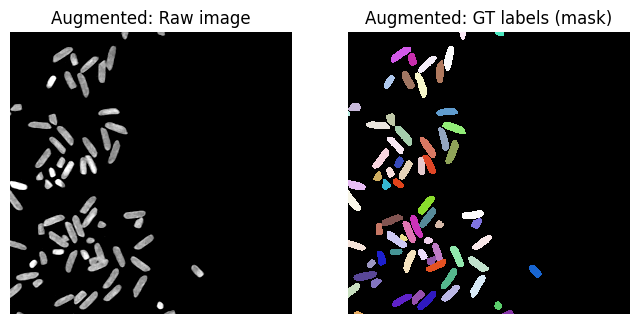

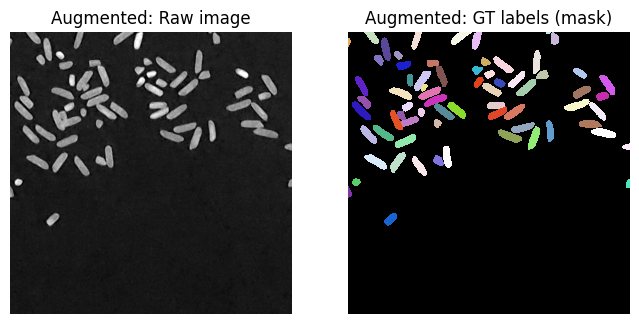

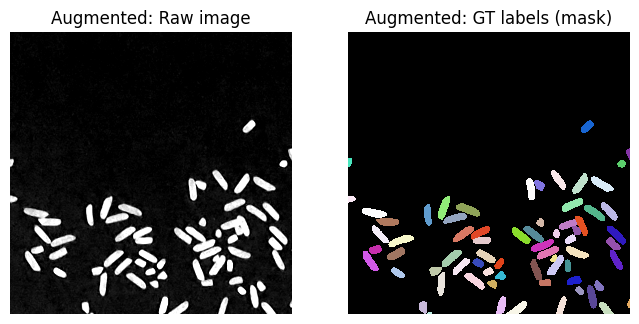

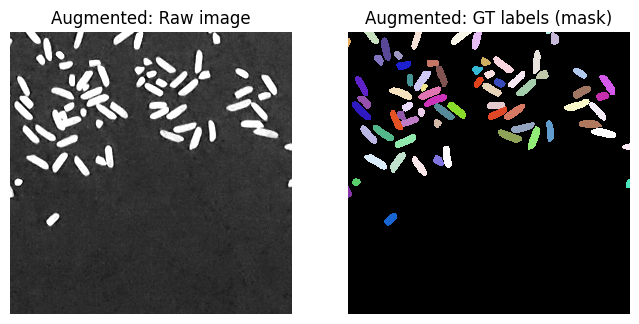

In [58]:
plt.figure(figsize=(8,5))
plt.subplot(121); plt.imshow(img,cmap='gray', clim = (0,1));   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels (mask)')

for _ in range(4):
    plt.figure(figsize=(8,5))
    x,y = augmenter(img, lbl)
    plt.subplot(121); plt.imshow(x,cmap='gray', clim = (0,1));   plt.axis('off'); plt.title('Augmented: Raw image')
    plt.subplot(122); plt.imshow(y,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('Augmented: GT labels (mask)')
None;

## Model Training

We recommend to monitor the progress during training with [TensorBoard](https://www.tensorflow.org/programmers_guide/summaries_and_tensorboard).

In [61]:
!rm -rf logs

In [64]:
%reload_ext tensorboard
%tensorboard --logdir=. --port 15930

<IPython.core.display.Javascript object>

In [63]:
quick_demo = True

if quick_demo:
    print (
        "NOTE: This is only for a quick demonstration!\n"
        "      Please set the variable 'quick_demo = False' for proper (long) training.",
        file=sys.stderr, flush=True
    )
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
                epochs=40, steps_per_epoch=25)

    print("====> Stopping training and loading previously trained demo model from disk.", file=sys.stderr, flush=True)
    model = StarDist2D.from_pretrained("2D_versatile_fluo")
else:
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter)
None;

NOTE: This is only for a quick demonstration!
      Please set the variable 'quick_demo = False' for proper (long) training.


Epoch 1/40


Cause: Unable to locate the source code of <function _gcd_import at 0x7fb34a56f400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7fb34a56f400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
25/25 [==============================] - 98s 4s/step - loss: 2.4643 - prob_loss: 0.5046 - dist_loss: 9.7984 - prob_kld: 0.4017 - dist_relevant_mae: 9.7983 - dist_relevant_mse: 150.1880 - dist_dist_iou_metric: 0.0050 - val_loss: 2.2882 - val_prob_loss: 0.4563 - val_dist_loss: 9.1594 - val_prob_kld: 0.3472 - val_dist_relevant_mae: 9.1592 - val_dist_relevant_mse: 141.0441 - val_dist_dist_iou_metric: 0.0263 - lr: 3.0000e-04
Epoch 2/40
25/25 [==============================] - 90s 

====> Stopping training and loading previously trained demo model from disk.


Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 [==============================] - 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


## Threshold optimization

While the default values for the probability and non-maximum suppression thresholds already yield good results in many cases, we still recommend to adapt the thresholds to your data. The optimized threshold values are saved to disk and will be automatically loaded with the model.

In [65]:
if not quick_demo:
    model.optimize_thresholds(X_val, Y_val)

# 3. Prediction

We now load images from the sub-folder `test` that have not been used during training.

In [67]:
fXt = sorted(Path('data/StarRice/test/images/').glob('*.tif'))
print(f"{len(fXt)} files found")
Xt = list(map(imread,map(str,tqdm(fXt))))

n_channel = 1 if Xt[0].ndim == 2 else Xt[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

5 files found


100%|██████████| 5/5 [00:00<00:00, 146.72it/s]


## Prediction

Make sure to normalize the input image beforehand or supply a `normalizer` to the prediction function.

Calling `model.predict_instances` will
- predict object probabilities and star-convex polygon distances (see `model.predict` if you want those)
- perform non-maximum suppression (with overlap threshold `nms_thresh`) for polygons above object probability threshold `prob_thresh`.
- render all remaining polygon instances in a label image
- return the label instances image and also the details (coordinates, etc.) of all remaining polygons

In [71]:
print("Number of elements in Xt:", len(Xt))


Number of elements in Xt: 5


In [73]:
img = normalize(Xt[4], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img, verbose = True)

predicting instances with nms_thresh = 0.3
non-maximum suppression...
keeping 199/7660 polyhedra
NMS took 0.1930 s


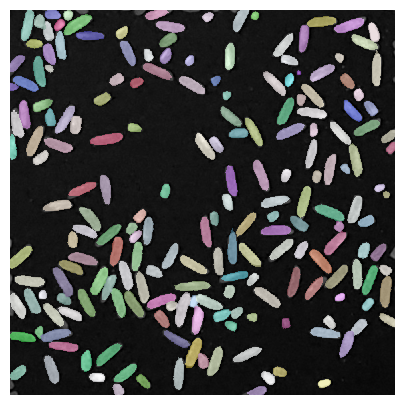

In [74]:
plt.figure(figsize=(5,5))
plt.imshow(img if img.ndim==2 else img[...,:3], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
plt.axis('off');

## More example results

In [75]:
def example(model, i, show_dist=True):
    img = normalize(Xt[i], 1,99.8, axis=axis_norm)
    labels, details = model.predict_instances(img)

    plt.figure(figsize=(13,10))
    img_show = img if img.ndim==2 else img[...,:3]
    coord, points, prob = details['coord'], details['points'], details['prob']
    plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    a = plt.axis()
    _draw_polygons(coord, points, prob, show_dist=show_dist)
    plt.axis(a)
    plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(labels, cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
    plt.tight_layout()
    plt.show()

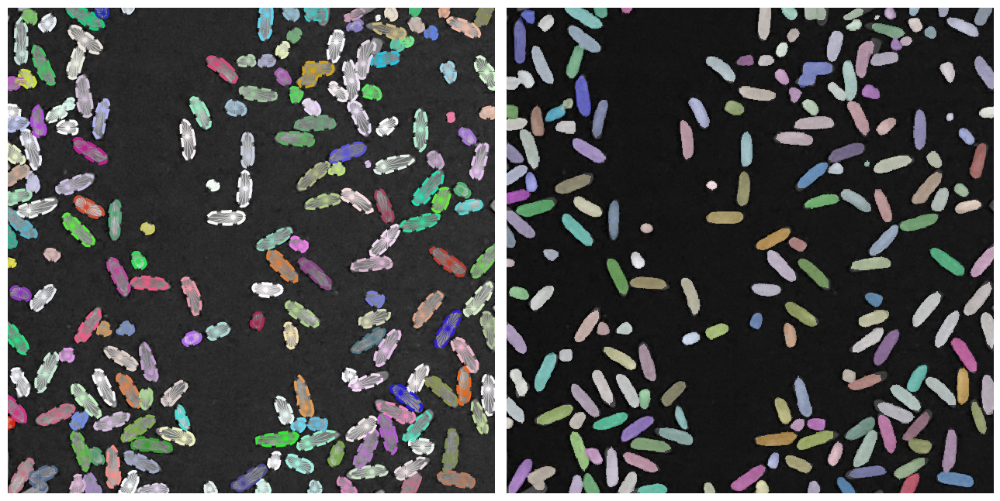

In [79]:
example(model,1)

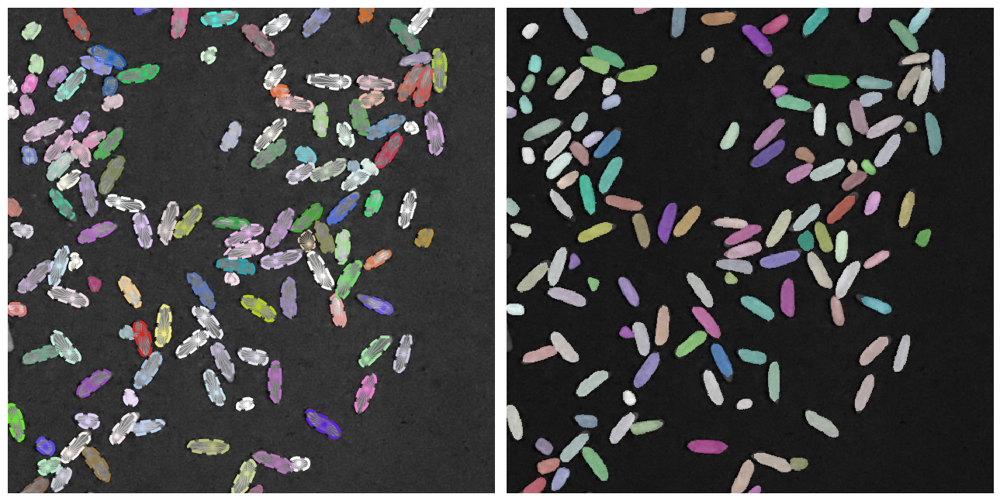

In [80]:
example(model, 2)

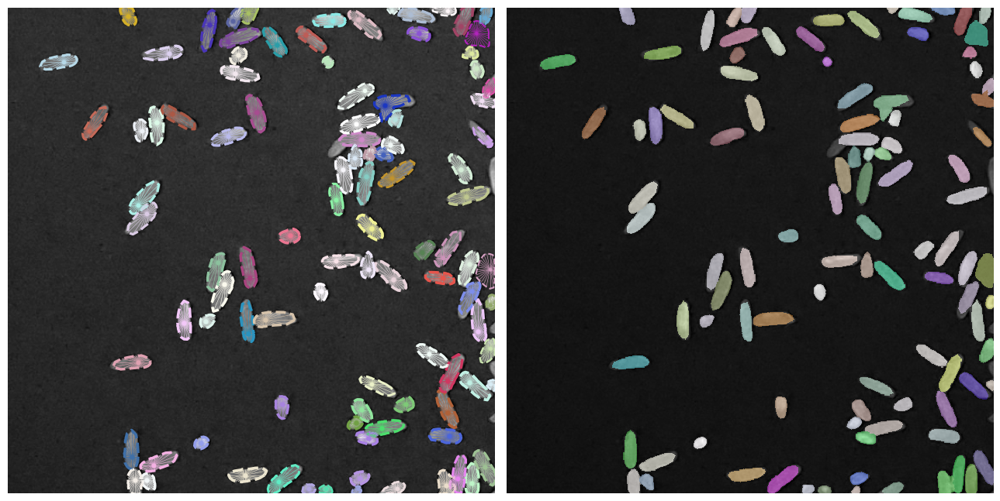

In [81]:
example(model, 3)

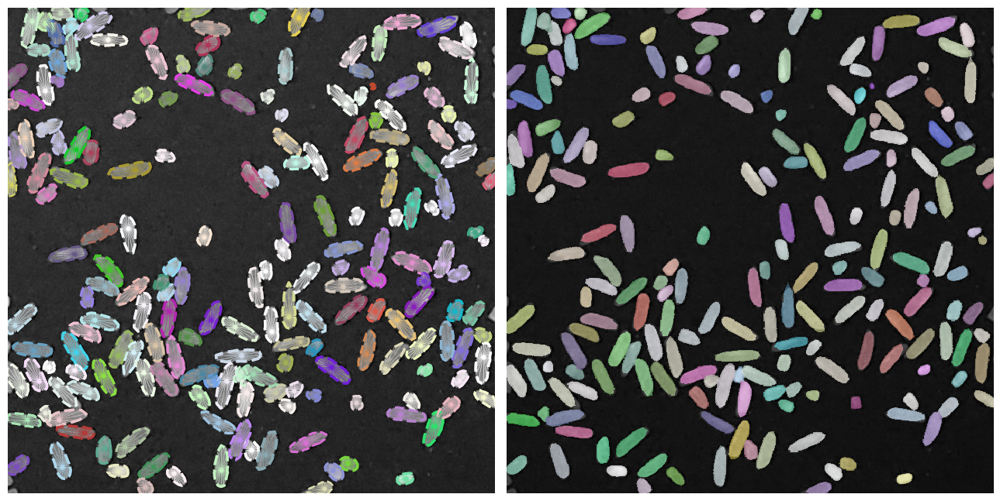

In [82]:
example(model, 4)

## Evaluation and Detection Performance

Besides the losses and metrics during training, we can also quantitatively evaluate the actual detection/segmentation performance on the validation data by considering objects in the ground truth to be correctly matched if there are predicted objects with overlap (here [intersection over union (IoU)](https://en.wikipedia.org/wiki/Jaccard_index)) beyond a chosen IoU threshold $\tau$.

The corresponding matching statistics (average overlap, accuracy, recall, precision, etc.) are typically of greater practical relevance than the losses/metrics computed during training (but harder to formulate as a loss function).
The value of $\tau$ can be between 0 (even slightly overlapping objects count as correctly predicted) and 1 (only pixel-perfectly overlapping objects count) and which $\tau$ to use depends on the needed segmentation precision/application.

Please see the Wikipedia page on [Sensitivity and specificity](https://en.wikipedia.org/wiki/Sensitivity_and_specificity) for definitions of the abbreviations used in the evaluation below. Note that `mean_true_score` refers to the average overlap (IoU) of all true positives (tp), i.e. correctly predicted objects in terms of the chosen overlap threshold.

First predict the labels for all validation images:

In [84]:
Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val)]

100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


Choose several IoU thresholds $\tau$ that might be of interest and for each compute matching statistics for the validation data.

In [85]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:00<00:00, 22.96it/s]


Example: Print all available matching statistics for $\tau=0.5$

In [89]:
stats[taus.index(0.1)]

DatasetMatching(criterion='iou', thresh=0.1, fp=2, tp=332, fn=25, precision=0.9940119760479041, recall=0.9299719887955182, accuracy=0.924791086350975, f1=0.9609261939218524, n_true=357, n_pred=334, mean_true_score=0.814695000314579, mean_matched_score=0.8760425153985081, panoptic_quality=0.8418122000356142, by_image=False)

In [90]:
stats[taus.index(0.2)]

DatasetMatching(criterion='iou', thresh=0.2, fp=2, tp=332, fn=25, precision=0.9940119760479041, recall=0.9299719887955182, accuracy=0.924791086350975, f1=0.9609261939218524, n_true=357, n_pred=334, mean_true_score=0.814695000314579, mean_matched_score=0.8760425153985081, panoptic_quality=0.8418122000356142, by_image=False)

In [91]:
stats[taus.index(0.3)]

DatasetMatching(criterion='iou', thresh=0.3, fp=2, tp=332, fn=25, precision=0.9940119760479041, recall=0.9299719887955182, accuracy=0.924791086350975, f1=0.9609261939218524, n_true=357, n_pred=334, mean_true_score=0.814695000314579, mean_matched_score=0.8760425153985081, panoptic_quality=0.8418122000356142, by_image=False)

In [87]:
stats[taus.index(0.4)]

DatasetMatching(criterion='iou', thresh=0.4, fp=2, tp=332, fn=25, precision=0.9940119760479041, recall=0.9299719887955182, accuracy=0.924791086350975, f1=0.9609261939218524, n_true=357, n_pred=334, mean_true_score=0.814695000314579, mean_matched_score=0.8760425153985081, panoptic_quality=0.8418122000356142, by_image=False)

In [88]:
stats[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=3, tp=331, fn=26, precision=0.9910179640718563, recall=0.927170868347339, accuracy=0.9194444444444444, f1=0.9580318379160637, n_true=357, n_pred=334, mean_true_score=0.8134005250049239, mean_matched_score=0.8772930133738907, panoptic_quality=0.8404746379935103, by_image=False)

In [92]:
stats[taus.index(0.8)]

DatasetMatching(criterion='iou', thresh=0.8, fp=16, tp=318, fn=39, precision=0.9520958083832335, recall=0.8907563025210085, accuracy=0.8525469168900804, f1=0.9204052098408104, n_true=357, n_pred=334, mean_true_score=0.787096723455007, mean_matched_score=0.883627453690055, panoptic_quality=0.8132953119346961, by_image=False)

Plot the matching statistics and the number of true/false positives/negatives as a function of the IoU threshold $\tau$.

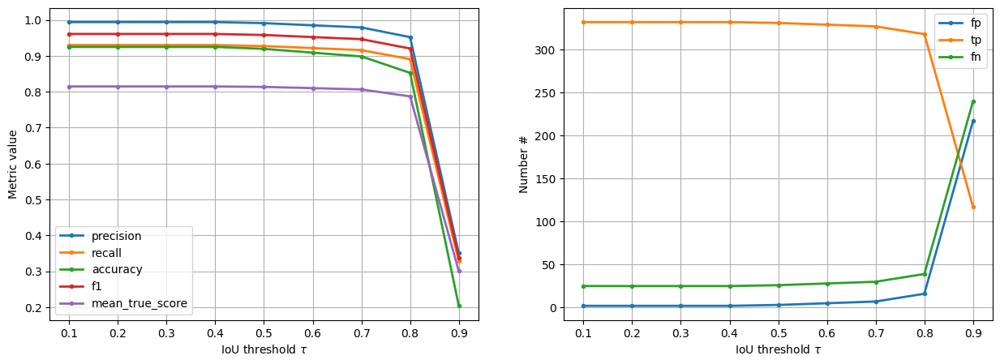

In [93]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

for m in ('precision', 'recall', 'accuracy', 'f1', 'mean_true_score'):
    ax1.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax1.set_xlabel(r'IoU threshold $\tau$')
ax1.set_ylabel('Metric value')
ax1.grid()
ax1.legend()

for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();

## Export your model to Fiji

In [94]:
if not quick_demo:
    model.export_TF()